## Endogenous gridpoint method 

The idea and algorithm are written in [my previous notebook](https://github.com/tokupooh/Julia_macro/blob/master/v_0_6_4/PE/PE_EGM.ipynb).

In [1]:
using Interpolations
using BenchmarkTools
using Plots
using LinearAlgebra
include("mywrapper.jl")
pyplot() # when we use gr() font size of figure is too small.  maybe it will be fixed.

Plots.PyPlotBackend()

In [2]:
struct Model{TI<:Integer, TF<:AbstractFloat}
    
    # primitive params
    β::TF # subjective discount factor
    σ::TF # relative risk aversion
    ϕ::TF # borrowing limit, positive
    
    # asset grid
    a2grid::Array{TF,1}
    na::TI
    # shock grid
    zgrid::Array{TF,2}
    nz::TI
    Π::Array{TF,2}

    # iteration settings
    maxiter::TI
    tol::TF

end

In [3]:
function Construct(β=0.96,
                    σ=3.0,
                    ϕ=0.5,
                    a2min=1e-5,
                    a2max=10.0, 
                    na=100)
    
    
    # create asset grid  a2 = a' + phi
    a2grid = linspace(a2min,a2max,na) 
    # In Julia v.1.0.0, logspace is depreciated, so we use linspace(my wrapper)
    
    # create shock grid
    zgrid = [0.2  1.0] # productivity shock
    Π =[0.7 0.3; 0.1 0.9] # transition matrix
    nz = size(zgrid,2)
    
    #iteration settings
    tol = 1e-13
    maxiter = 10000
    
    return  Model(β,σ,ϕ,a2grid,na,zgrid,nz,Π,maxiter,tol)  
end

Construct (generic function with 7 methods)

In [4]:
function EGM(m::Model)
    
    """
    This function is written by Tokuma Suzuki.
    My code is based on Quantitative Macroeconomics lecture at University of Tokyo taught by Makoto Nirei.
    
    """
     
    # utility function
    u(c::Float64) = (c^(1.0-m.σ))/(1.0-m.σ)
    u′(c::Float64) =  1.0/(c^m.σ)  #c^(-m.σ)
    u′_inv(val::Float64) = 1.0/(val^(1.0/m.σ)) # val^(-1.0/m.σ)
    
    # factor price
    r = 0.03 
    w = 1.0 
    
    # for convenience
    a2mat = repeat(m.a2grid,1,2)
    zmat = repeat(m.zgrid ,m.na)

    # initialize asset matrices 
    amat = zeros(m.na,m.nz)  # asset grid (we compute  it later) range [a2min-ϕ, a2max-ϕ]
    a1= zeros(m.na,m.nz) # today's asset + ϕ
    resource  = zeros(m.na)
    wealth = zeros(m.na,m.nz) # wealth matrix
    wealth = (1.0+r).*a2mat + w.*zmat .-r*m.ϕ
    
    # initialize consumption matrices
    c1 = zeros(m.na,m.nz) # consumption matrix in this period
    c2 = zeros(m.na,m.nz)  # consumption matrix in the next period
    EMU = zeros(m.na,m.nz) # expected marginal utility matrix in the next period
    frac_br =m.β*(1.0+r) 
    
    # initialize policy functions 
    pol_c =zeros(m.na,m.nz) # policy function for consumption
    pol_a = zeros(m.na,m.nz) # policy function for asset
    pol_a = 0.5 * a2mat # initial guess of policy function 
    new_pol_a =zeros(m.na,m.nz) # updated policy
    
    # to deal with negative consumption
    small = 1e-13
    
 
    
    # main loop 
    for it in 1:m.maxiter
        
        c2 = wealth - pol_a 
        @. @views c2[c2<0.0] = small # replace negative consumption with very small number
        EMU = u′.(c2)*m.Π'
        @. c1 = u′_inv(frac_br*EMU)　# recall frac_br =m.β*(1.0+r) 
        
        # budget constraint: c + a' = (1+r)a + w*z 
        # rearranging this as
        # c + a' +ϕ = (1+r)(a+ϕ) +w*z -r*ϕ
        
        a1 .=((c1+a2mat) - w.*zmat .+ m.ϕ*r)./(1.0+r) # compute asset matrix
        
        # compute updated policy function
        
        @inbounds for i in 1:m.nz
            @views resource =(1.0+r).*a1[:,i] .+ w.*m.zgrid[i].-r*m.ϕ
            itp = LinearInterpolation(resource, m.a2grid,
                                        extrapolation_bc = Interpolations.Linear())
            @views new_pol_a[:,i]  = itp[wealth[:,i]]
        end
        
        @views @. new_pol_a[new_pol_a<m.a2grid[1]] = m.a2grid[1] # replace extrapolation with lower bound.
        err = maximum(abs.(new_pol_a-pol_a))
        pol_a =deepcopy(new_pol_a)

        if err < m.tol
            # compute asset grid 
            
            @views @. amat = (wealth - w*zmat -m.ϕ)/(1.0+r)
            pol_c = wealth- new_pol_a 
            break
        end
        
    end
   
    return amat[:,1], pol_a, pol_c
end

EGM (generic function with 1 method)

In [5]:
m = Construct()

Model{Int64,Float64}(0.96, 3.0, 0.5, [1.0e-5, 0.10102, 0.20203, 0.30304, 0.40405, 0.50506, 0.60607, 0.70708, 0.80809, 0.9091  …  9.09091, 9.19192, 9.29293, 9.39394, 9.49495, 9.59596, 9.69697, 9.79798, 9.89899, 10.0], 100, [0.2 1.0], 2, [0.7 0.3; 0.1 0.9], 10000, 1.0e-13)

In [6]:
agrid, pol_a, pol_c = EGM(m)

([-0.49999, -0.39898, -0.29797, -0.19696, -0.09595, 0.00506, 0.10607, 0.20708, 0.30809, 0.4091  …  8.59091, 8.69192, 8.79293, 8.89394, 8.99495, 9.09596, 9.19697, 9.29798, 9.39899, 9.5], [1.0e-5 0.458061; 0.0518425 0.54547; … ; 9.30437 10.021; 9.40391 10.1208], [0.185 0.526949; 0.237208 0.543581; … ; 1.07659 1.15994; 1.08109 1.1642])

In [7]:
@time EGM(m);

  0.048344 seconds (22.87 k allocations: 12.816 MiB)


In [8]:
@benchmark EGM(m)

BenchmarkTools.Trial: 
  memory estimate:  12.82 MiB
  allocs estimate:  22870
  --------------
  minimum time:     28.624 ms (0.00% GC)
  median time:      31.059 ms (4.11% GC)
  mean time:        31.542 ms (2.73% GC)
  maximum time:     42.544 ms (5.90% GC)
  --------------
  samples:          159
  evals/sample:     1

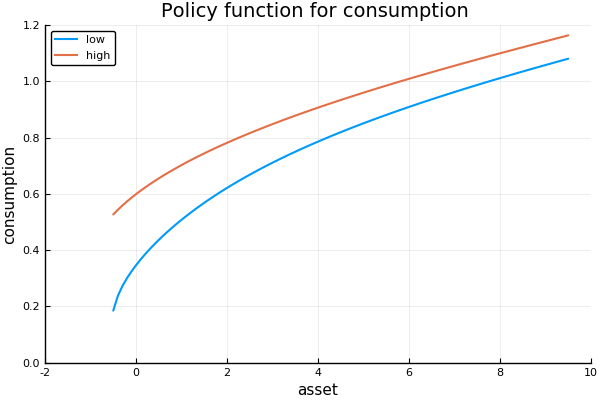

In [9]:
labels = ["low" "high"]
plot(agrid,pol_c, linewidth = 1.5,label=labels,legend=:topleft, ylims=(0,1.2), yticks=0:0.2:1.2,xlims=(-2,10)) 
title!("Policy function for consumption ")
xaxis!("asset")
yaxis!("consumption")

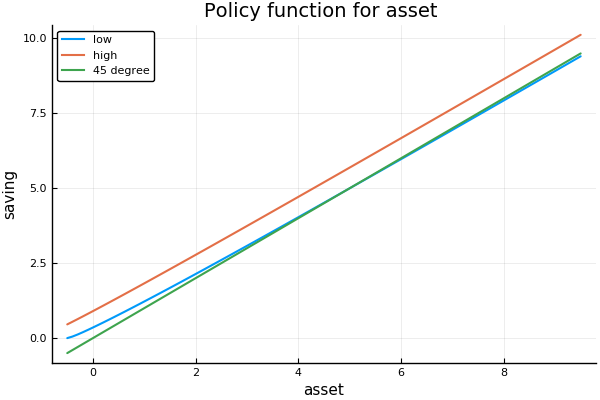

In [10]:
plot(agrid,pol_a,linewidth = 1.5, label = labels,legend=:topleft)
plot!(agrid,agrid,linewidth = 1.5 ,label = "45 degree",legend=:topleft)
title!("Policy function for asset ")
xaxis!("asset")
yaxis!("saving")